<a href="https://colab.research.google.com/github/virajparikh199725/Heart-Disease-Classification/blob/master/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and i take a photo of a dog, i want to know what breed it is.

## 2. Data

The data we're using is from kaggle's dog breed identification competition:


https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the testing set (these images do not have labels, because we'll want to predict them)


In [ ]:
# Unzip the uploaded data into google drive.
#!unzip "drive/My Drive/DogVision/dog-breed-identification.zip" -d "drive/My Drive/DogVision/"

###  Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.2.0
TF Hub version: 0.8.0
GPU available (YESSSS!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     c54c1132c4f2322347fe7e0ae3062c86  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


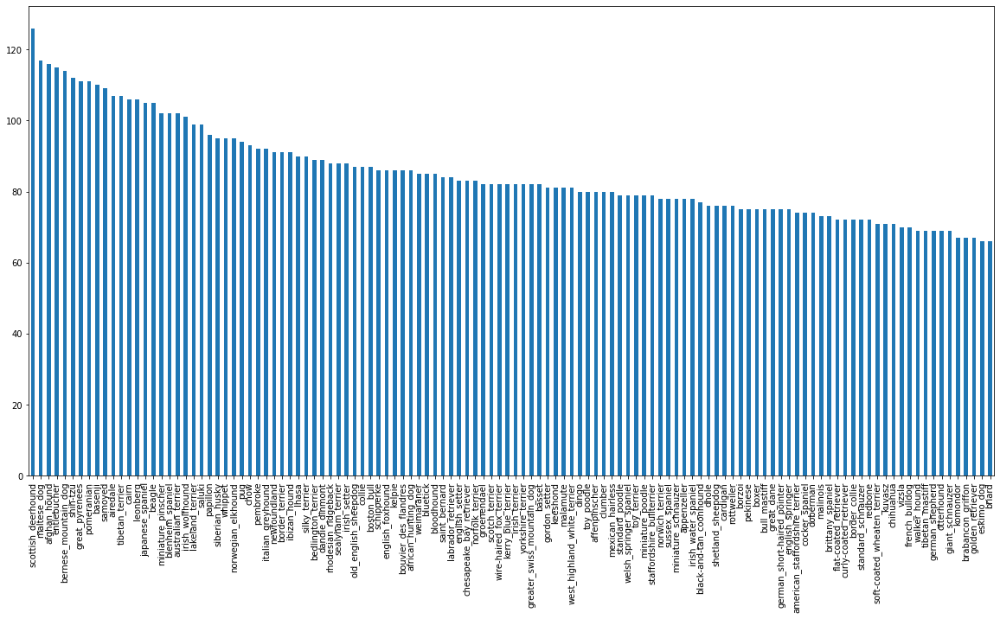

In [ ]:
# How many images are there of each breed?
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

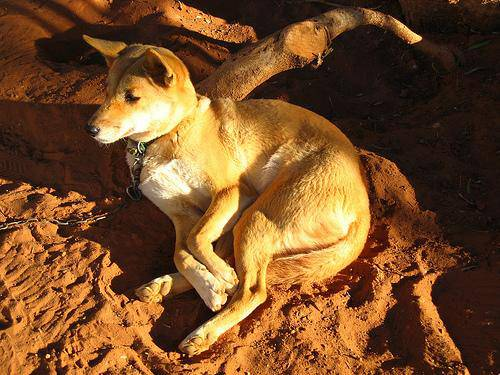

In [ ]:
 # Let's view an image
 from IPython.display import Image
 Image("drive/My Drive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames


In [ ]:

labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filename = ["drive/My Drive/DogVision/train/"+fname+".jpg" for fname in labels_csv["id"]]

# Check the first 10
filename[:10]

['drive/My Drive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

import os
os.listdir("drive/My Drive/DogVision/train")[:10]

['ed154eec8a5e855fabc7c6e37edbac1c.jpg',
 'f1b4c01dfbe424368a7d9404e1f0f6c3.jpg',
 'ea06fc45fe1d39398d6ad82c2f741742.jpg',
 'efd5885fbb8243c327c98eb9505742bd.jpg',
 'f42938973bccdb8f6f556ea160a9357f.jpg',
 'f2da0cd3a1f77cc96505d387d9dd731b.jpg',
 'eff6f9f023d63b83056ee3cabd204d9a.jpg',
 'ed52e8685e7befe1a346651c0f9aaeaf.jpg',
 'ee8315e3cef238ea380d197ceb26a476.jpg',
 'f193aef29f983b44a4458c03ec309ca1.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/DogVision/train/"))==len(filename):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed.


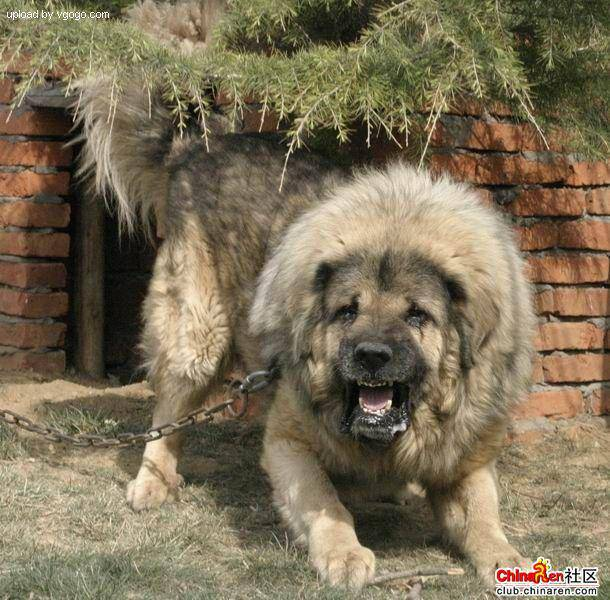

In [ ]:
# One more check 
from IPython.display import Image
Image(filename[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does the same thing as above(i.e converting into arrray)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:

# See if number of labels matches the number of filenames
if len(labels) == len(filename):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set,
we're going to create our own.

In [ ]:
# Setup X&y variables
X = filename
y = boolean_labels

In [ ]:
len(filename)

10222

We're going to start off experimenting with ~1000 imagesand increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`.

In [ ]:
# Define an image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with three colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (Makes the processing more efficient - We normalise the image by converting color channel values from 0-255 to 0-1)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired 
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go... they all might not fit into memory.

So that is why we do about 32 (this is batch size)images at a time( You can manually adjust batch suze if need be)

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, labels)`.

In [ ]:
# Create a simple function to return a tuple(image, labels)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns  tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`. Let's make a function to turn all our data into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs. 
  It shuffles the data if its training data but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # Only filepaths and no labels eg(i/p =[1,2,3,4])o/p =1,2,3,4)
                                                                                        
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Creating training data batches..")
    # Turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processpr function is faster than 
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches..
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch.

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize = (10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

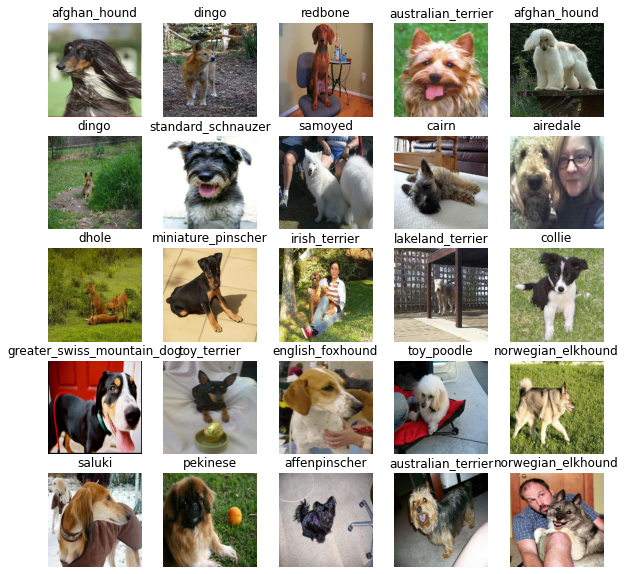

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

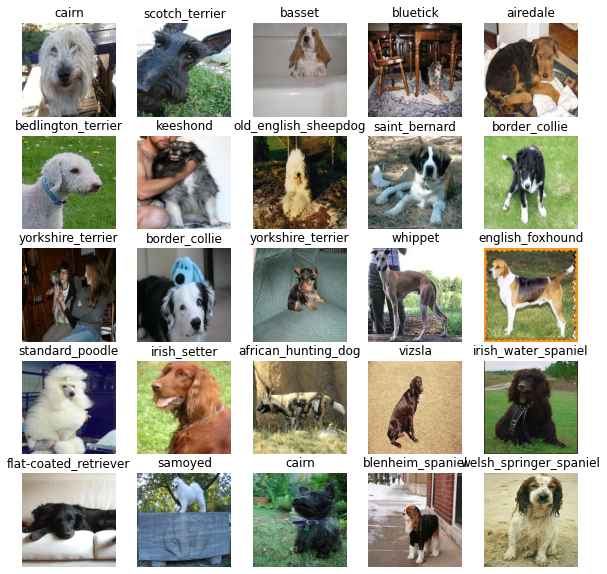

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors)of our model.
* The URL of the model we want to use from TensorFlow hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None ,IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got out inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which :
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion
(do this first, then this, then that).
* Compiles the model(says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting)
* Return the model.

All of these steps can be found here:https://www.tensorflow.org/guide/keras/overview


In [ ]:
# Create a function which builds a Keras model:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")# Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

Basically, incase our model training is going on for a week, to check its progress we can use: https://www.tensorflow.org/guide/keras/custom_callback

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard Callback

To setup a TensorBoards callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models `fit()` function.✅
3. Visualise our models training logs with the `%tensorboard` magic function (we'll do this after model training)✅ 

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime 

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("Drive/drive/My Drive/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available(YES!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available(YES!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model 

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model


In [ ]:
# Fit the model to the data
model = train_model()


Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 551s 22s/step - loss: 4.7471 - accuracy: 0.0737 - val_loss: 3.5388 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 212ms/step - loss: 1.6969 - accuracy: 0.6762 - val_loss: 2.2033 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 5s 209ms/step - loss: 0.5889 - accuracy: 0.9375 - val_loss: 1.7345 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 5s 205ms/step - loss: 0.2582 - accuracy: 0.9887 - val_loss: 1.5634 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 5s 207ms/step - loss: 0.1518 - accuracy: 0.9987 - val_loss: 1.4869 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 207ms/step - loss: 0.1010 - accuracy: 0.9987 - val_loss: 1.4420 - val_accuracy: 0.6150
Epoch 7/100
25/25 [=============================

*** Question *** It looks like our model is overfitting because it is performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

The solution to the above question can be found in the link provided:
https://www.kdnuggets.com/2019/12/5-techniques-prevent-overfitting-neural-networks.html

*** Note *** Overfitting is a good thing in the beginning. It means that our model is learning.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir Drive/drive/My\ Drive/DogVision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model.

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 158ms/step


array([[1.9978490e-03, 1.4217582e-05, 8.3305291e-04, ..., 2.4754027e-04,
        7.8994790e-06, 1.0476728e-03],
       [2.2979877e-03, 8.6314610e-04, 9.4753746e-03, ..., 6.5682578e-04,
        4.2365617e-03, 6.9814996e-05],
       [3.3826516e-05, 6.4899551e-04, 4.0000978e-05, ..., 9.3749797e-05,
        1.7105776e-04, 2.1739498e-04],
       ...,
       [6.9230273e-06, 2.1985010e-04, 5.6144196e-05, ..., 2.3666333e-05,
        5.9887109e-04, 4.7285523e-04],
       [4.9870783e-03, 1.5820292e-04, 2.5798103e-05, ..., 1.8241817e-05,
        1.1343254e-04, 7.1414700e-03],
       [4.2402768e-04, 2.7592363e-05, 3.9505845e-04, ..., 3.5670889e-03,
        1.3938667e-04, 2.7367218e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.99784897e-03, 1.42175822e-05, 8.33052909e-04, 5.82381363e-05,
       3.34081735e-04, 2.96410326e-05, 4.57158638e-03, 3.14759876e-04,
       2.55857711e-04, 8.39327229e-04, 2.21850074e-04, 2.54873830e-05,
       8.42006120e-04, 9.76496522e-05, 1.45106437e-03, 5.94294106e-04,
       1.86359350e-04, 2.41695479e-01, 9.44978237e-05, 1.74434885e-04,
       2.20817674e-04, 2.49369245e-04, 2.41539910e-05, 6.09094510e-04,
       2.45545143e-05, 3.81573656e-04, 5.40664792e-02, 7.88649049e-05,
       2.86216149e-04, 6.65163825e-05, 1.63221324e-04, 1.35618495e-03,
       1.88900594e-04, 1.17306816e-04, 8.75087862e-04, 6.02801656e-03,
       3.51442541e-05, 1.57760442e-04, 1.76756104e-04, 3.70275578e-04,
       1.57759211e-03, 2.53494491e-05, 8.58786880e-05, 9.06276284e-04,
       6.78919750e-05, 1.08989725e-05, 1.19402057e-05, 2.86985014e-04,
       1.02832459e-03, 3.03221368e-05, 5.45432966e-04, 1.54204918e-05,
       3.87492386e-04, 1.46824401e-04, 2.78467400e-04, 1.30661756e-05,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])} ")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.49875850e-04 4.51675587e-04 1.81397874e-04 5.88099974e-05
 5.24458569e-03 9.52363625e-05 2.81420682e-04 2.81502306e-03
 1.36333331e-02 2.27881558e-02 1.18181786e-04 6.15918907e-06
 3.98195989e-04 1.43923080e-02 1.76799961e-03 1.97524577e-03
 7.40765536e-05 4.65457008e-04 1.31967739e-04 4.60926880e-04
 1.60936586e-04 6.59094716e-04 1.40143471e-04 6.66673441e-05
 1.97997987e-02 8.01383430e-05 5.98866463e-05 5.45488401e-05
 2.94576108e-04 1.35204886e-04 1.29147098e-04 3.71714035e-04
 3.26212503e-05 7.37976079e-05 2.88172705e-05 1.09108762e-04
 2.28419201e-04 7.73281325e-04 1.51524990e-04 2.46460065e-01
 2.03594478e-04 1.39707903e-04 3.69546073e-03 4.33323148e-05
 9.32866475e-04 7.79583861e-05 2.62639602e-04 7.23662321e-04
 2.13556050e-05 7.31588283e-04 5.69666918e-05 1.77085822e-04
 4.17987903e-04 1.81376596e-03 1.98309208e-05 2.17998808e-04
 8.05275995e-05 1.65299542e-04 1.76516231e-04 1.39201529e-05
 4.05262035e-05 1.33418641e-03 3.87057917e-05 9.95660375e-05
 7.46184669e-05 3.868176

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

***Note:*** Prediction probabilities are also known as confidence levels.


In [ ]:
# Turn Prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predictin probabilities
pred_label = get_pred_label(predictions[99])
pred_label  

'scottish_deerhound'

Now since our validation data is still in a batch dataset,
we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batched dataset

def unbatch_the_batched(data_set):
  """
  Unbatches a batched dataset(of image,label tensors) and returns seperate arrays of images and labels
  """

  images=[]
  labels=[]

  # Loop through unbatched data
  for image, label in data_set.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatch our validation data
val_images, val_labels = unbatch_the_batched(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for same n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"



  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

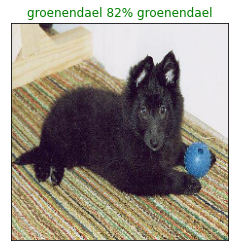

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.✅
* Find the prediction using `get_pred_label()`✅
* Find the top 10:
   * Prediction probabilties indexes✅
   * Prediction probabilities values✅
   * Prediction labels✅
* Plot the top 10 prediction probability values and labels, colouring the true label green.✅
   

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                               top_10_pred_values,
                               color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

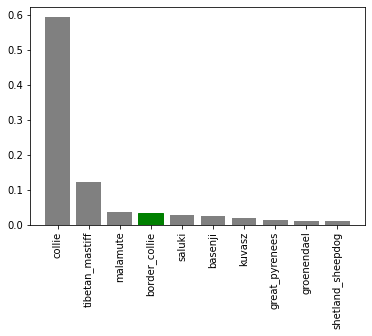

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

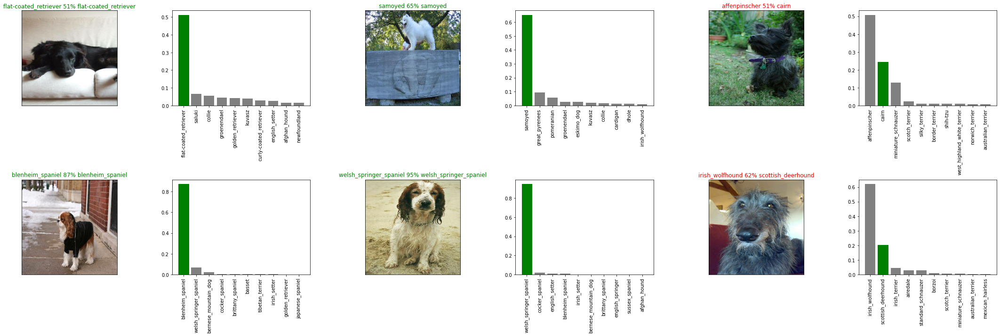

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 2
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

*** Challenge: *** How would you create a confusion matrix with our models predictions and true labels?

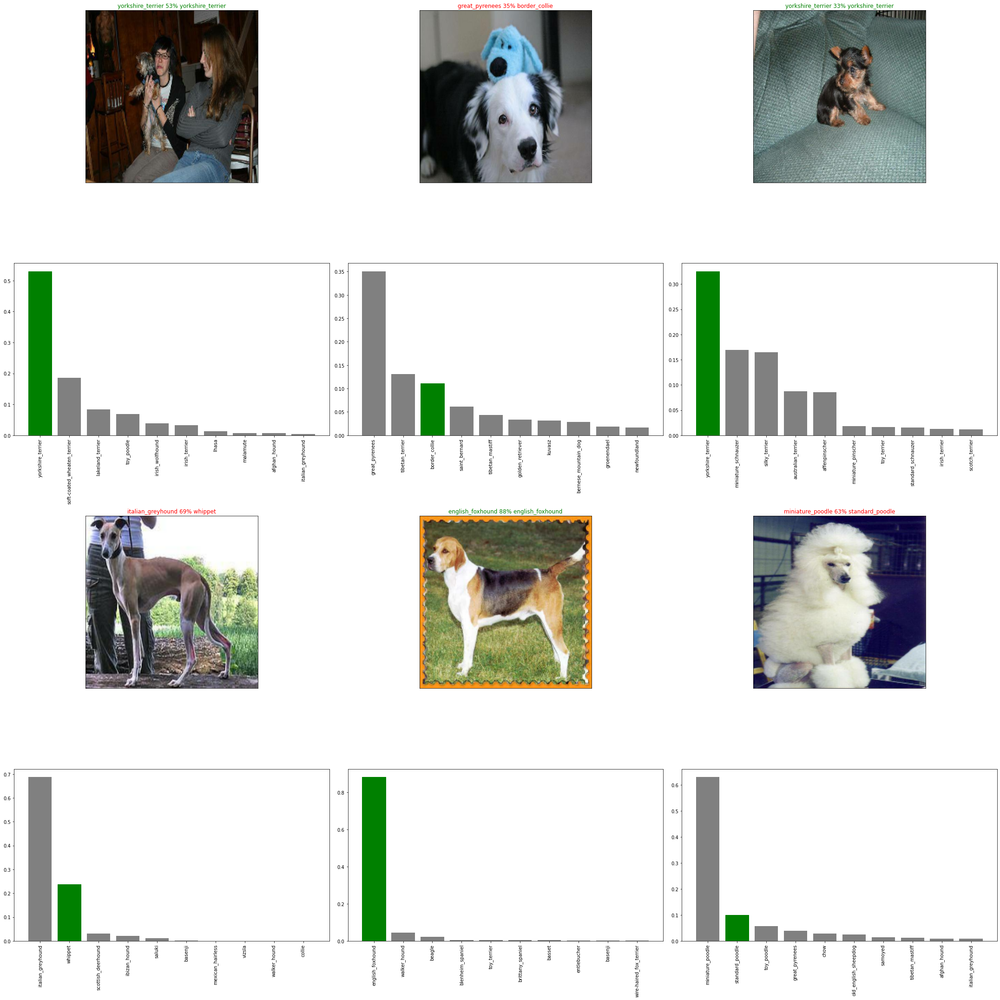

In [ ]:
i_multiplier = 10
n_rows = 2
n_cols = 3
n_img = n_rows*n_cols
plt.figure(figsize=(10*n_cols, 15*n_rows))

for i in range(int(n_img/2)):
  plt.subplot(2*n_rows, n_cols, i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(2*n_rows, n_cols, i+4)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
  
for i in range(int(n_img/2),int(n_img)):
    plt.subplot(2*n_rows, n_cols, i+4)
    plot_pred(prediction_probabilities=predictions,
              labels = val_labels,
              images = val_images,
              n = i+i_multiplier)
    plt.subplot(2*n_rows, n_cols, i+7)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels = val_labels,
                   n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model.
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/My Drive/DogVision/models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a funtion to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/My Drive/DogVision/models/20200613-07121592032365-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/DogVision/models/20200613-07121592032365-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
model = load_model('drive/My Drive/DogVision/models/20200613-07091592032197-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: drive/My Drive/DogVision/models/20200613-07091592032197-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 60s 9s/step - loss: 1.3285 - accuracy: 0.6350


[1.328493595123291, 0.6349999904632568]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)


NameError: ignored

## Training a big dog model 🐶 (on the full data)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

In [ ]:
full_data

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

** Note ** Running the cell below will take a little while (maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3986s 12s/step - loss: 1.3466 - accuracy: 0.6661
Epoch 2/100
320/320 [==============================] - 74s 233ms/step - loss: 0.4013 - accuracy: 0.8825
Epoch 3/100
320/320 [==============================] - 75s 234ms/step - loss: 0.2378 - accuracy: 0.9341
Epoch 4/100
320/320 [==============================] - 75s 235ms/step - loss: 0.1522 - accuracy: 0.9631
Epoch 5/100
320/320 [==============================] - 74s 232ms/step - loss: 0.1061 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 74s 232ms/step - loss: 0.0758 - accuracy: 0.9881
Epoch 7/100
320/320 [==============================] - 75s 234ms/step - loss: 0.0585 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 75s 236ms/step - loss: 0.0471 - accuracy: 0.9930
Epoch 9/100
320/320 [==============================] - 74s 233ms/step - loss: 0.0387 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 74s 232m

In [ ]:
save_model(full_model, suffix = "All_images_MobileNetv2-Adam")

Saving model to : drive/My Drive/DogVision/models/20200616-10041592301849-All_images_MobileNetv2-Adam.h5...


'drive/My Drive/DogVision/models/20200616-10041592301849-All_images_MobileNetv2-Adam.h5'

In [ ]:
# Load a full model
loaded_full_model = load_model('drive/My Drive/DogVision/models/20200616-10041592301849-All_images_MobileNetv2-Adam.h5')

Loading a saved model from: drive/My Drive/DogVision/models/20200616-10041592301849-All_images_MobileNetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily we created `create_data_batches` which can takea a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames✅
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (since the test data doesn't have any labels).✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test images filenames
test_path = "drive/My Drive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/DogVision/test/f191370aae3cc8e282cfd72ecdcc2226.jpg',
 'drive/My Drive/DogVision/test/ecc4566304626790004cd2c3626218b6.jpg',
 'drive/My Drive/DogVision/test/ec2a07ae6eaa64dac4154584ef229937.jpg',
 'drive/My Drive/DogVision/test/f57f8ce3fe1d928828e37a9bd78574d9.jpg',
 'drive/My Drive/DogVision/test/ebe4a8b8507fa28905cb7e70b90b9170.jpg',
 'drive/My Drive/DogVision/test/eca94e609a77c2ed87b79c3c08a11a62.jpg',
 'drive/My Drive/DogVision/test/ef69016a79094a8bd47f42ccc14ba63a.jpg',
 'drive/My Drive/DogVision/test/f5174e3ab52edb2e414e135259047c48.jpg',
 'drive/My Drive/DogVision/test/ed8e5c431d6539db02614ddc1f35ce10.jpg',
 'drive/My Drive/DogVision/test/e8b49a4b2c22d3c5cb3c88c61654e991.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data will take a long time to run (about an ~ 1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model.
test_predictions = loaded_full_model.predict(test_data, verbose=1)


  2/324 [..............................] - ETA: 46:04

KeyboardInterrupt: ignored

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/DogVision/preds_array.csv", test_predictions, delimiter=',' )

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/DogVision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions[:10]

array([[8.40575041e-08, 2.10199569e-09, 1.46555740e-10, ...,
        1.89355234e-08, 7.02231337e-05, 4.24774598e-08],
       [3.42413728e-07, 1.58722566e-11, 3.08957233e-13, ...,
        4.93592424e-14, 7.82267862e-11, 3.68789971e-10],
       [8.98783770e-10, 2.97203471e-08, 1.27024840e-11, ...,
        1.00078615e-12, 2.47599519e-09, 6.92650971e-12],
       ...,
       [1.14091554e-08, 5.22280743e-08, 2.73159662e-10, ...,
        1.67607936e-08, 1.87687932e-09, 2.87474849e-10],
       [2.58668892e-10, 6.46547427e-10, 3.97039290e-09, ...,
        2.41276710e-09, 1.47575969e-08, 2.42915746e-07],
       [4.60517091e-09, 2.23189129e-08, 5.01364683e-09, ...,
        5.08548759e-08, 2.01587946e-09, 2.34025022e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed:
https://www.kaggle.com/c/dog-breed-identification/data

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed✅
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
os.path.splitext(test_filenames[0]) #Splits the last part, and thats why in the next we use test_path

('drive/My Drive/DogVision/test/f191370aae3cc8e282cfd72ecdcc2226', '.jpg')

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f191370aae3cc8e282cfd72ecdcc2226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ecc4566304626790004cd2c3626218b6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ec2a07ae6eaa64dac4154584ef229937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f57f8ce3fe1d928828e37a9bd78574d9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ebe4a8b8507fa28905cb7e70b90b9170,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f191370aae3cc8e282cfd72ecdcc2226,8.40575e-08,2.102e-09,1.46556e-10,0.533474,2.08925e-08,8.20861e-07,9.71494e-06,2.02459e-10,5.21833e-09,3.77549e-11,1.02001e-06,6.21025e-05,2.05358e-08,8.94441e-07,1.09658e-05,3.4492e-08,3.48478e-07,1.8613e-07,6.62634e-09,2.02685e-10,2.75249e-08,3.60265e-12,1.14237e-07,6.54125e-07,9.99763e-07,1.23682e-06,0.00012216,5.6539e-10,1.08296e-07,1.32646e-09,1.49166e-08,2.03563e-09,4.22372e-07,8.71304e-06,3.84635e-09,5.85885e-06,1.71158e-08,3.45042e-10,7.61256e-10,...,3.48833e-09,5.58388e-06,0.0185039,0.392979,6.57589e-10,0.000117673,1.87467e-06,1.70676e-09,6.0136e-08,1.98612e-10,8.8248e-09,4.80173e-08,7.406e-09,1.09871e-08,1.11995e-07,1.72166e-08,5.77336e-08,9.27957e-05,2.25668e-11,2.10367e-08,9.32667e-08,7.58125e-07,1.30698e-09,2.49169e-08,1.11807e-07,1.81099e-05,4.25144e-07,9.97297e-09,1.85879e-06,3.80831e-05,2.09566e-08,1.6241e-08,2.03294e-09,0.000263553,3.8198e-07,2.73309e-08,3.80261e-07,1.89355e-08,7.02231e-05,4.24775e-08
1,ecc4566304626790004cd2c3626218b6,3.42414e-07,1.58723e-11,3.08957e-13,5.18621e-10,5.74413e-11,2.2985e-12,2.79077e-10,2.95201e-10,5.01956e-11,7.0846e-11,3.72226e-12,1.35295e-08,9.78194e-11,2.42728e-10,3.24053e-13,6.23994e-12,5.37958e-11,1.31407e-12,5.97182e-11,5.55341e-10,1.62041e-10,1.78165e-08,4.69958e-09,8.48995e-11,1.1797e-11,5.37089e-08,1.28203e-10,1.84532e-10,1.42409e-10,1.01053e-08,0.99494,6.99864e-12,9.36095e-10,4.0149e-08,1.0399e-10,9.49617e-10,1.52392e-11,1.13238e-10,2.22185e-11,...,8.67948e-12,1.14373e-08,1.83244e-09,3.34176e-10,2.40655e-10,1.53252e-05,7.85557e-11,0.00490174,1.81415e-08,2.52229e-10,1.42062e-09,2.15344e-09,7.677e-10,8.69305e-12,0.000130304,4.19739e-10,4.83362e-12,2.63662e-10,4.22104e-11,8.22704e-09,1.01461e-07,2.27453e-10,3.87527e-11,4.2175e-10,5.64251e-08,8.01452e-09,1.8318e-12,4.86374e-09,6.44125e-06,9.16141e-10,9.95261e-09,6.72161e-10,5.3771e-10,4.6413e-10,4.96564e-10,1.69229e-11,2.43156e-10,4.93592e-14,7.82268e-11,3.6879e-10
2,ec2a07ae6eaa64dac4154584ef229937,8.98784e-10,2.97203e-08,1.27025e-11,8.11319e-11,1.38441e-06,5.16138e-07,2.14625e-08,3.44904e-08,3.62868e-10,6.40334e-07,5.27647e-12,2.67742e-07,3.71038e-09,1.03375e-08,2.02513e-08,2.56905e-09,7.85463e-06,8.62963e-10,4.02226e-09,1.23353e-10,5.51627e-12,5.53957e-09,5.35078e-11,8.27478e-08,2.27835e-08,4.36103e-08,2.2515e-11,1.40205e-05,3.73781e-10,4.58803e-10,4.77342e-06,1.1133e-05,8.53296e-09,3.32118e-06,1.77366e-11,4.44577e-08,3.94004e-09,1.4086e-09,1.46505e-08,...,8.00449e-11,3.29918e-07,5.54344e-07,1.56349e-07,1.6625e-06,2.51577e-06,8.00591e-07,2.58674e-09,4.29163e-11,3.00339e-08,2.84626e-08,8.11011e-08,1.40254e-05,8.50963e-10,9.30822e-05,5.98364e-09,2.3357e-10,7.03387e-11,5.7718e-08,5.24816e-07,8.33823e-09,8.45403e-08,9.94262e-09,9.63469e-11,1.65193e-10,3.01396e-07,6.28242e-11,3.40586e-09,2.69134e-05,4.42269e-06,4.1161e-09,9.67364e-09,3.79657e-11,2.69552e-08,3.09079e-09,9.94251e-09,6.33358e-10,1.00079e-1

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/DogVision/full_model_predictions_submission_1_mobilenetv2.csv",index=False)

## Making predictions on custom images.

To make predictions on the custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels,  we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/DogVision/My-Dogs_Images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/DogVision/My-Dogs_Images/AmericanBullyBullyPitPitbullPurebredDogGhost2YearsOld1.jpg',
 'drive/My Drive/DogVision/My-Dogs_Images/labrador.jpeg',
 'drive/My Drive/DogVision/My-Dogs_Images/Great-Dane-On-White-01.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels 
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['staffordshire_bullterrier', 'bull_mastiff', 'great_dane']

In [ ]:
# Get custom images (our unbatchify() function wont work since there aren't labels... maybe we could fix that later)
custom_images = []
# Loop through unbathced data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

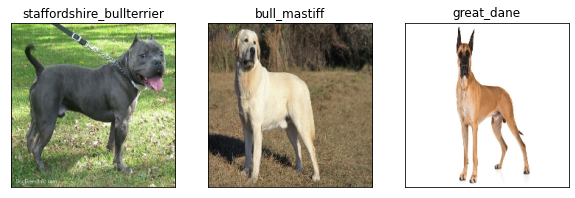

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)